# using `autograd` exercises

In [103]:
# a simple multi-input function defined in python 
def g(w_1,w_2):
    return 2**((np.sin(0.1*w_1**2 + 0.5*w_2**2)))*(np.tanh((np.cos(0.2*w_1*w_2))))*(np.tanh(w_1*w_2**(4)*np.tanh(w_1 + np.sin(0.2*w_2**2))))

Taking in two inputs, this function lives in three dimensions.  Below we plot it over a small range of its input.

<IPython.core.display.Javascript object>


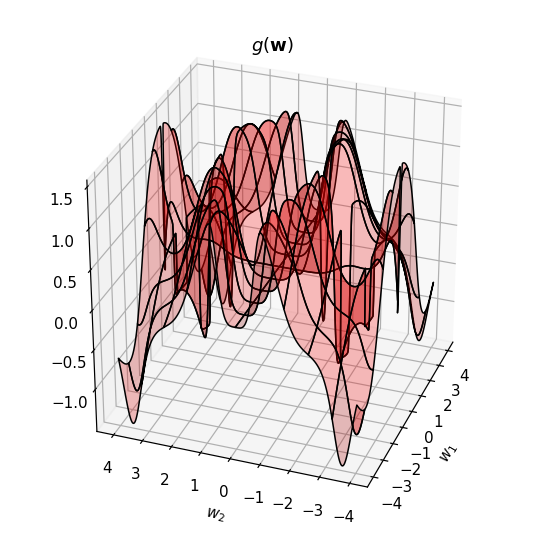

In [107]:
# This code cell will not be shown in the HTML version of this notebook
# import three-dimensional plotting library into namespace
from mpl_toolkits.mplot3d import Axes3D

### evaluate our function over a fine range of points on a square
# produce grid of values
s = np.linspace(-4,4,500)
w1,w2 = np.meshgrid(s,s)

# reshape grid and evaluate all points using our function
w_1 = np.reshape(w1,(1,np.size(w1)))
w_2 = np.reshape(w2,(1,np.size(w2)))
g_vals = g(w_1,w_2)

# generate figure and panel
fig = plt.figure(figsize = (5,5))
ax1 = fig.gca(projection='3d')

# re-shape inputs and output for plotting
# matplotlib's surface plotter requires all
# three input arguments are 2d arrays
w1 = np.reshape(w1,(np.size(s),np.size(s)))
w2 = np.reshape(w2,(np.size(s),np.size(s)))
g_vals = np.reshape(g_vals,(np.size(s),np.size(s)))

# Plot the surface
ax1.plot_surface(w1,w2,g_vals,alpha = 0.25,color = 'r',cstride = 50,rstride = 50,edgecolor = 'k')
ax1.set_title(r'$g\left(\mathbf{w}\right)$',fontsize = 12)
ax1.set_xlabel(r'$w_1$',fontsize = 10)
ax1.set_ylabel(r'$w_2$',fontsize = 10)
ax1.view_init(30,200)
plt.show()

# $\ell_1$ exercises

###  Steepest descent direction in the $\ell_1$ norm

With this setup we can actually choose any norm in the constraint that we wish to determine a descent direction.  For example, replacing the $\ell_2$ with the $\ell_1$ norm we have a similar looking problem 

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{minimize}} & \nabla g(\mathbf{v})^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{1}=1\\
\end{array}
\end{equation}

whose solution defines a new steepest descent direction with respect to the $\ell_1$ norm.  The direction we find here will certainly be different than the $\ell_2$ constrained version.

Using the toy in the next Python cell we explore possible solutions to this problem in two dimensions for a particular choice of gradient vector, gaining valuable geometric intuition as to what the solution should be.  There we plot an example gradient vector $\nabla g (\mathbf{v})$ as a red arrow, along with the $\ell_1$ unit ball. Moving the slider from left to right you can test various directions $\mathbf{d}$ (each shown as a black arrow) on this $\ell_1$ unit ball computing the inner product $\nabla g(\mathbf{v})^{T}\mathbf{d}$, whose value is simultaneously plotted in the right panel.  As you move the slider right the direction providing the *smallest* value is shown as a green arrow in the left panel, and is highlighted in green in the plot in the right panel.  


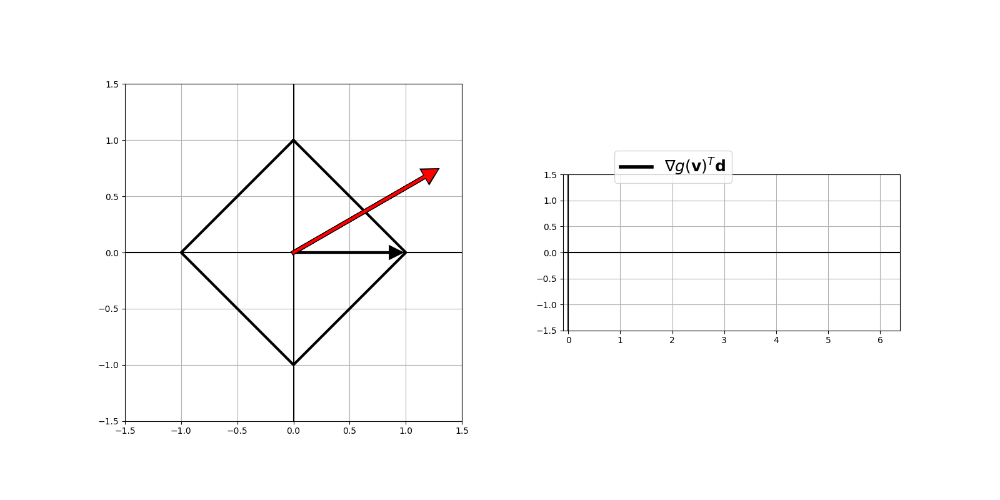
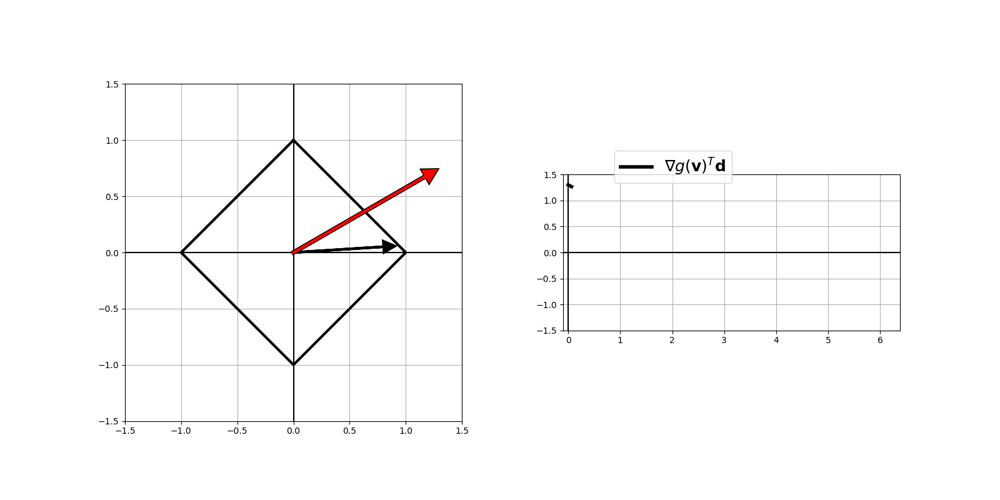
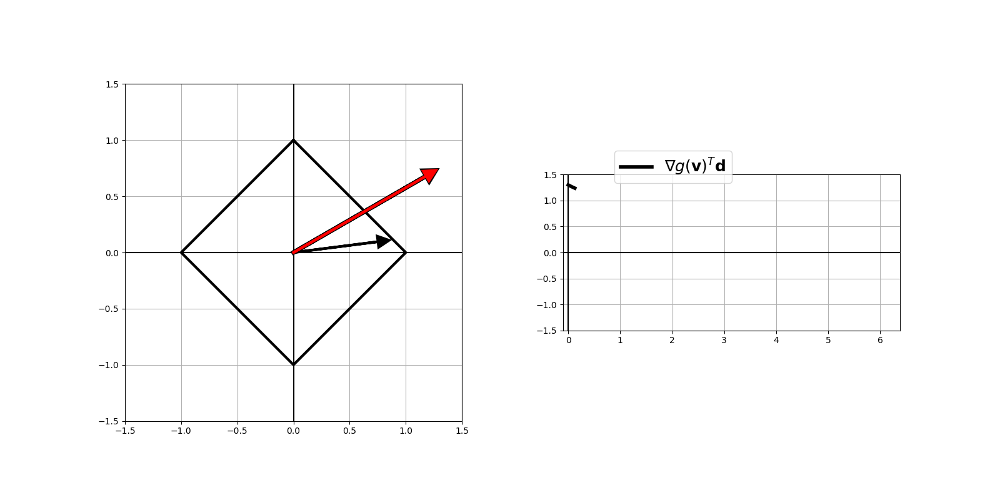
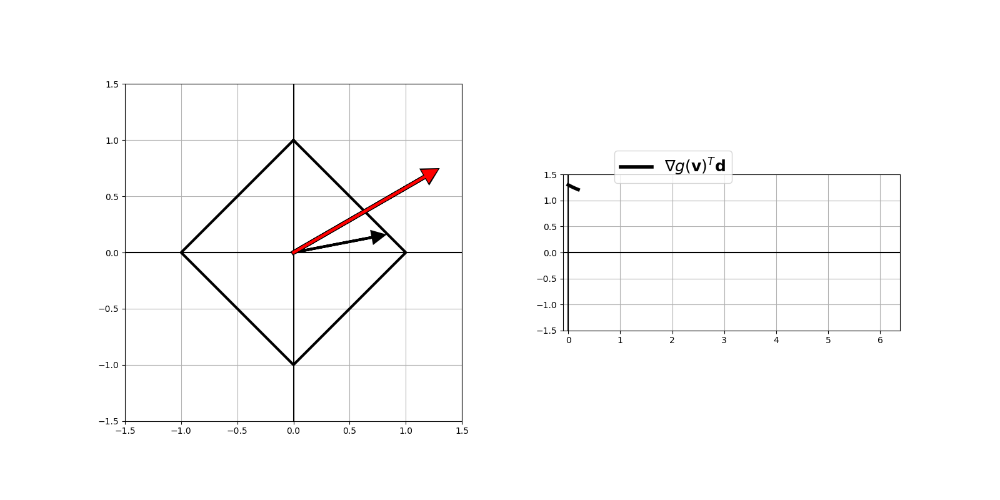
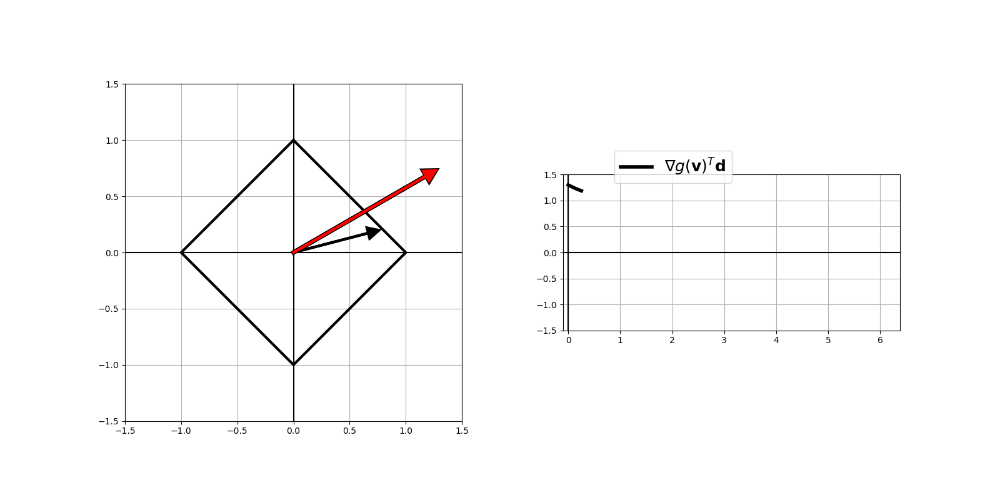
...
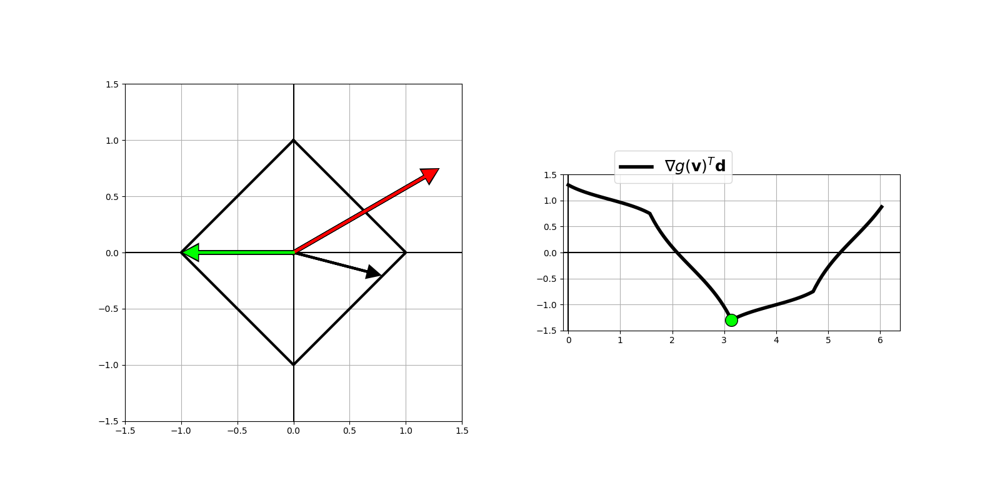
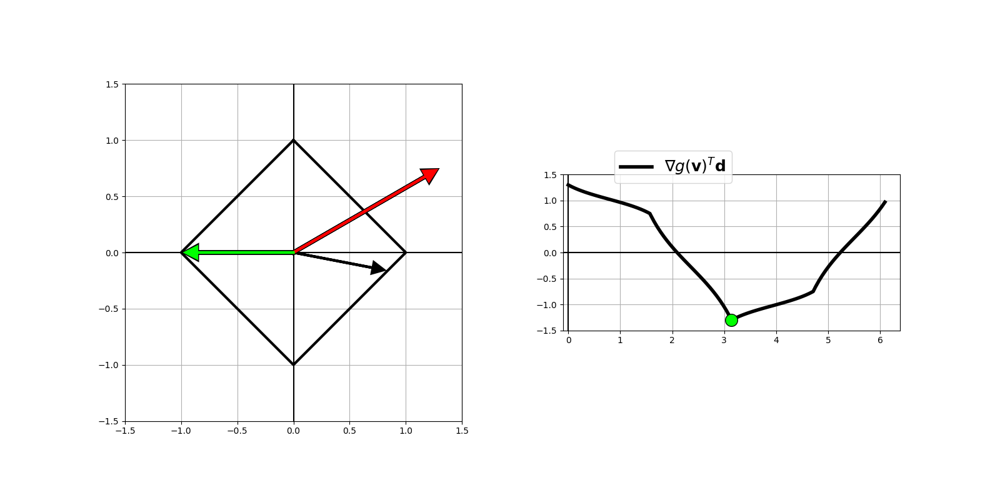
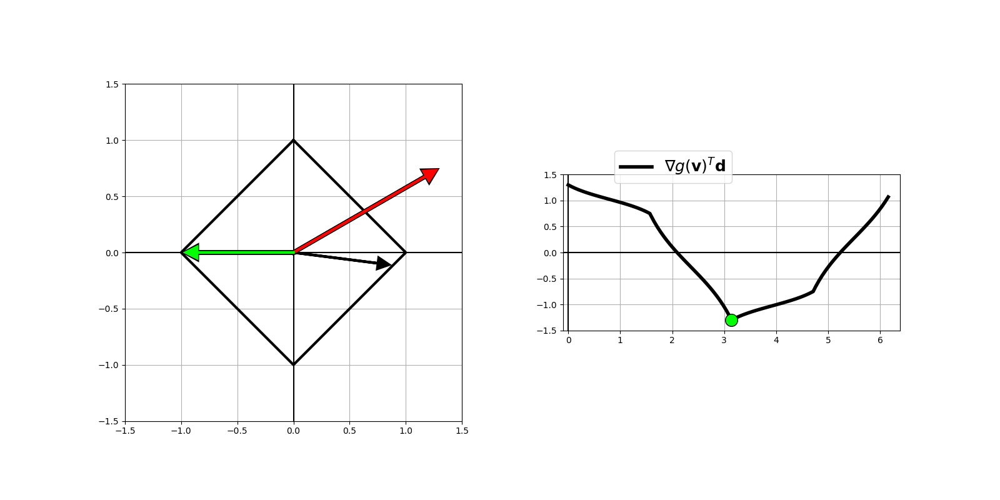
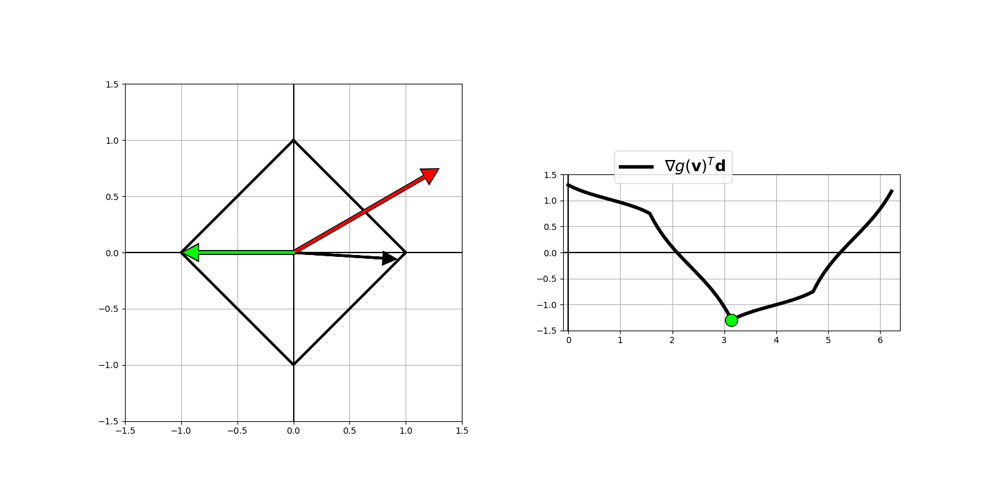
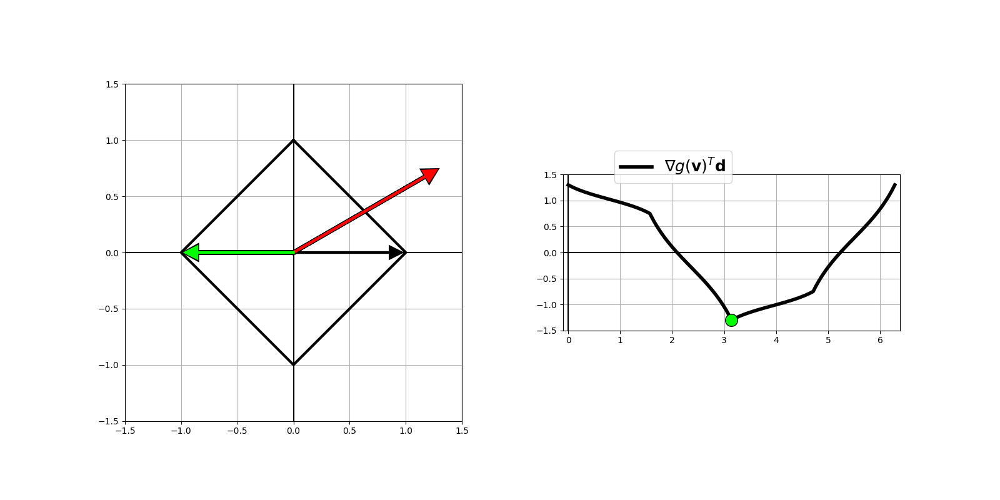

In [3]:
# This code cell will not be shown in the HTML version of this notebook
# create an animation showing the origin of the sine and cosine functions
num_frames = 100
pt = [1.3,0.75]
optlib.steepest_descent_direction.L1(pt,num_frames)

Let us try a different a gradient vector $\nabla g (\mathbf{v})$, this time in the second quadrant.  


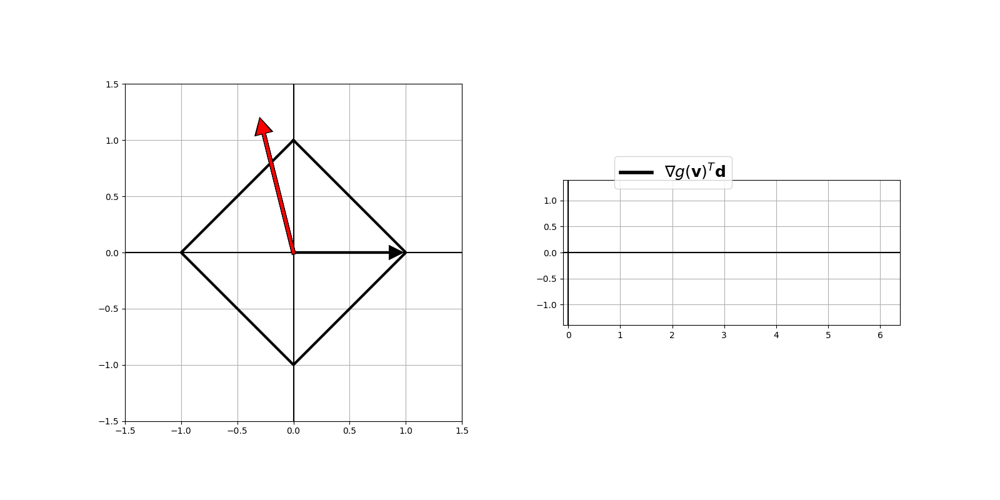
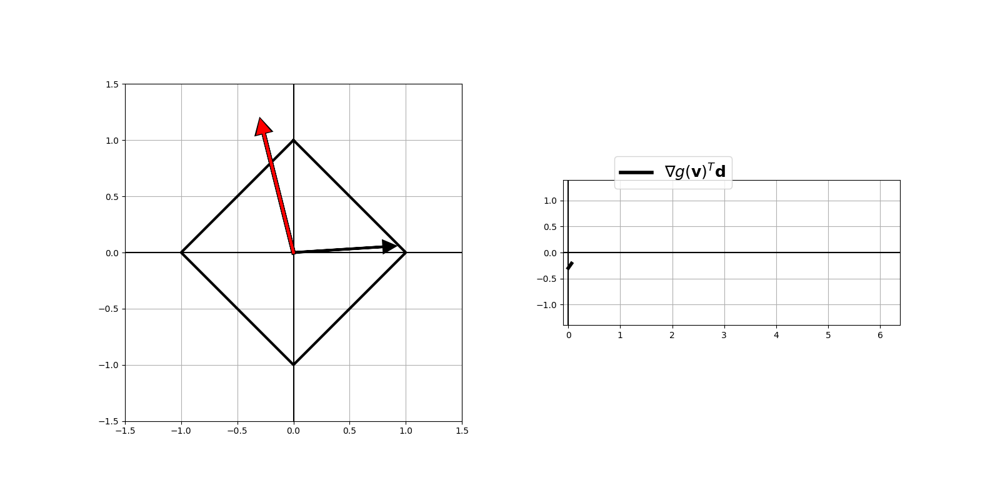
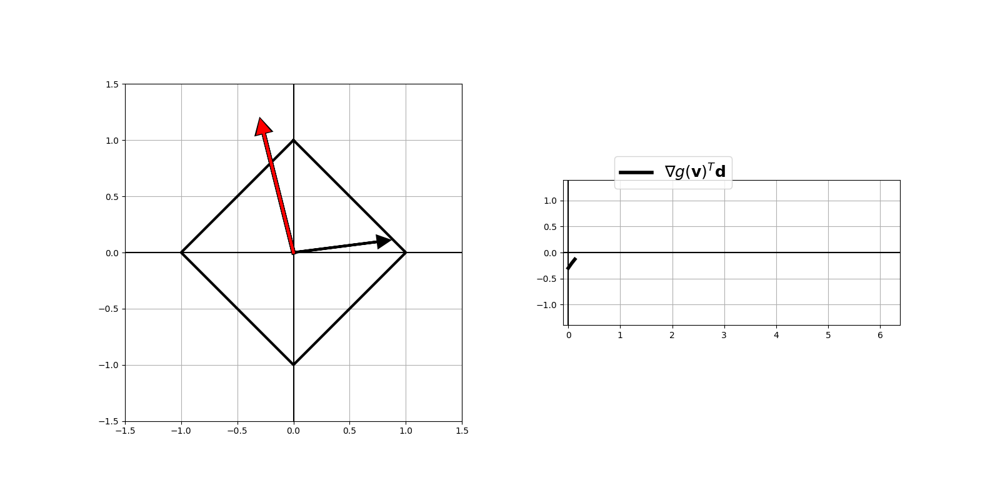
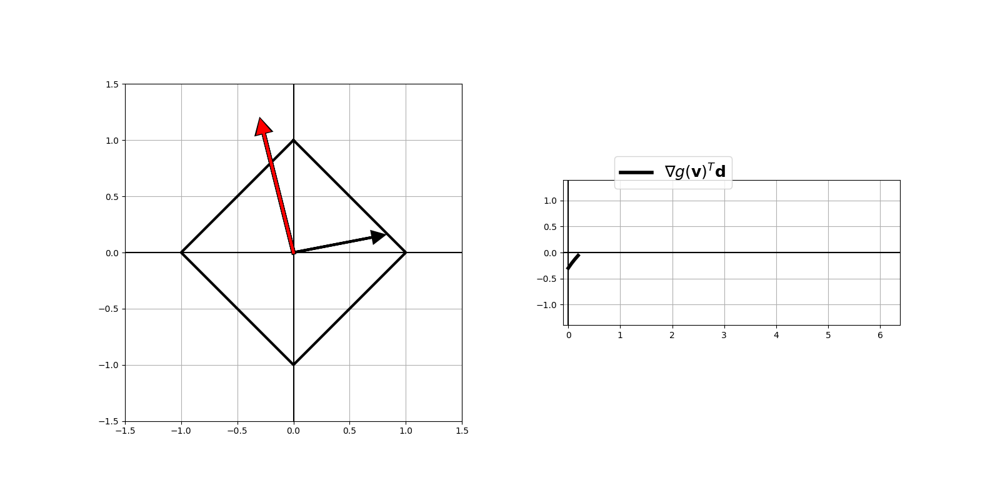
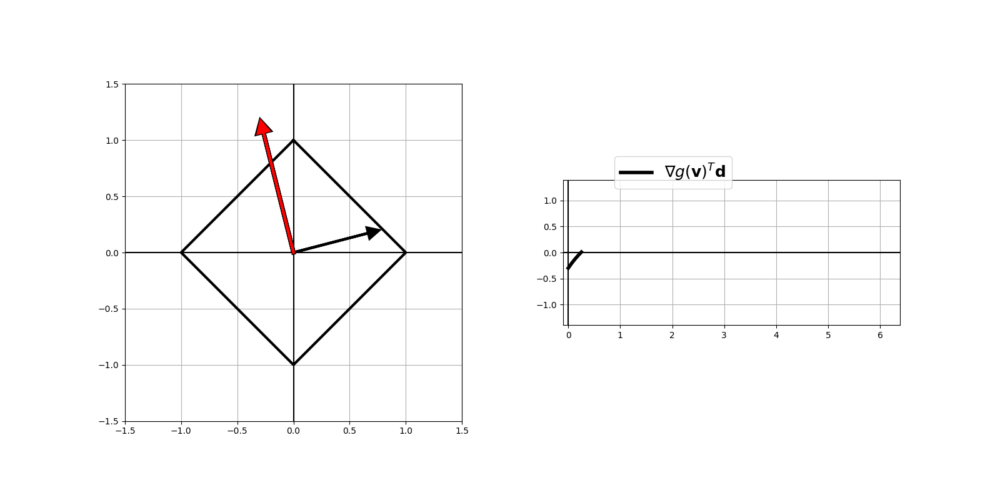
...
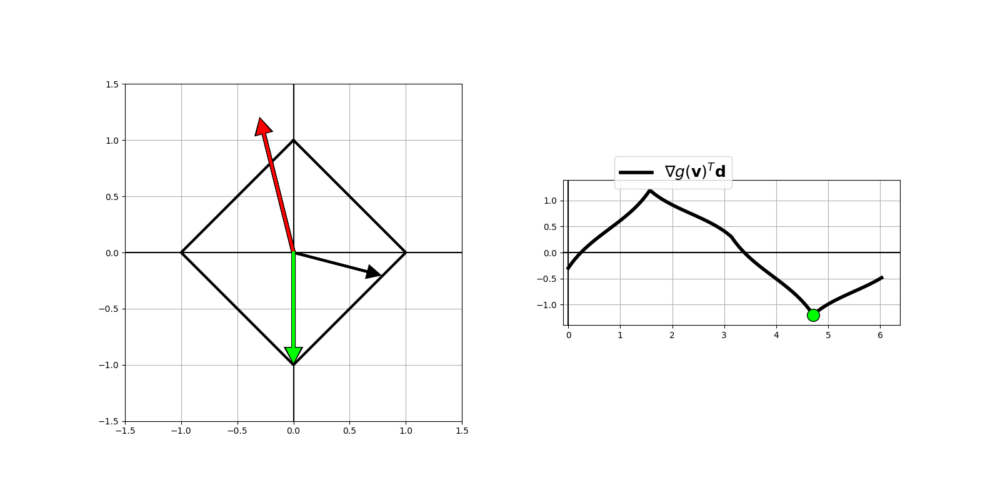
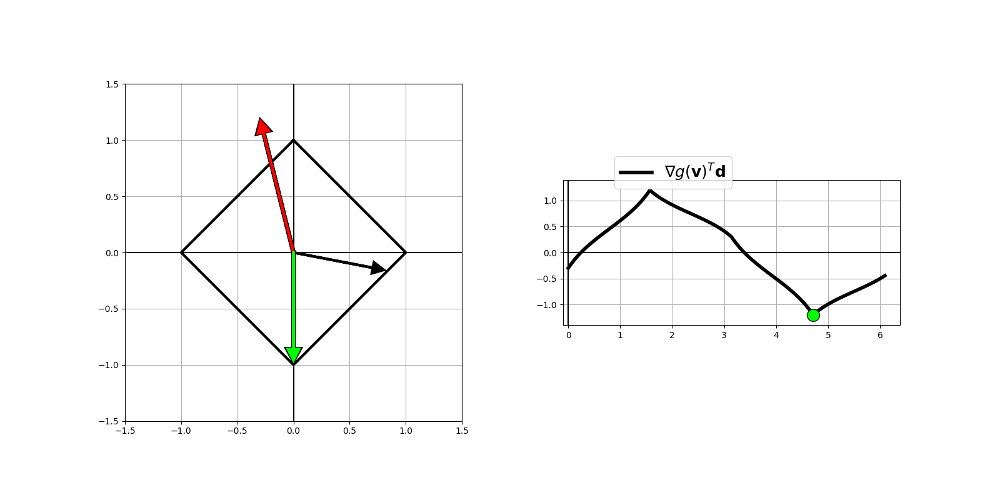
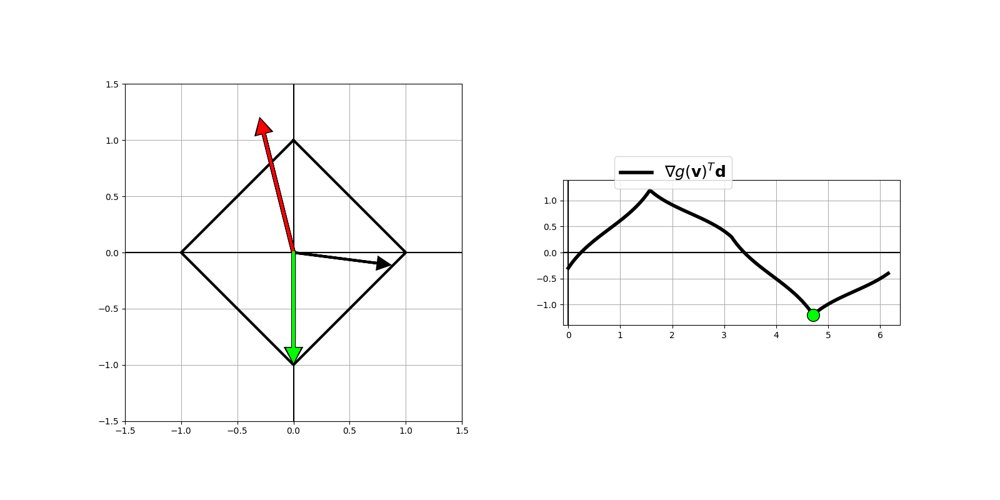
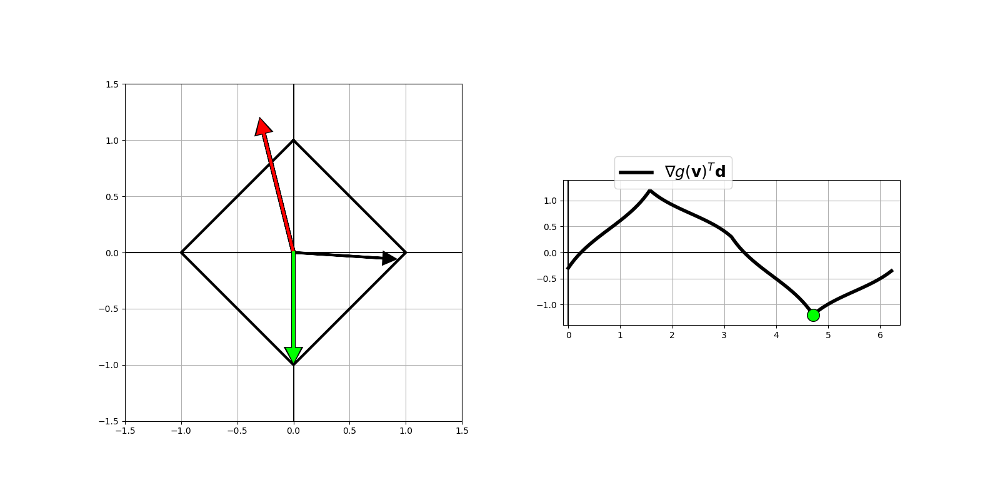
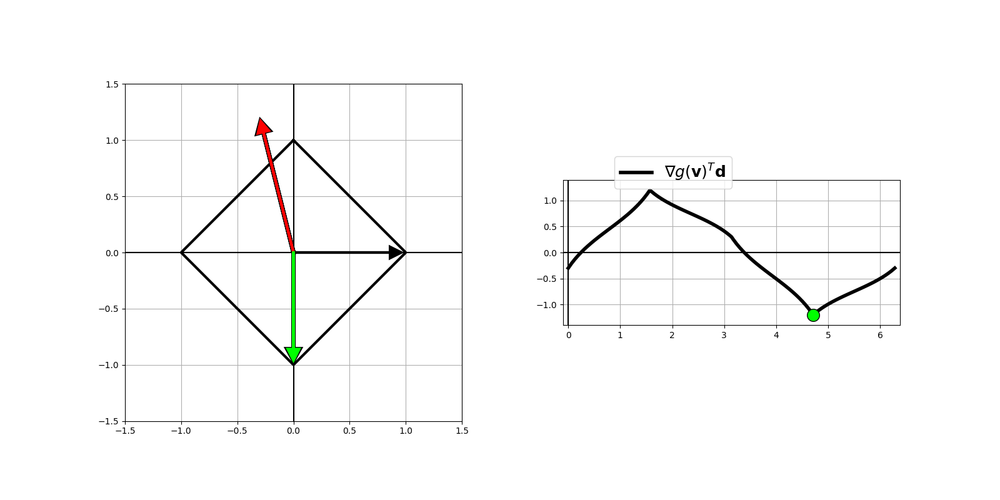

In [4]:
# This code cell will not be shown in the HTML version of this notebook
# create an animation showing the origin of the sine and cosine functions
num_frames = 100
pt = [-0.3,1.2]
optlib.steepest_descent_direction.L1(pt,num_frames)

Toying around with the slider above it looks as if the descent direction here is defined along a *coordinate axis* as the negative direction of only the largest (in magnitude) partial derivative of the gradient. Denoting by $j$ the index of the largest (in magnitude) entry in $\nabla g (\mathbf{v})$

$$j=\underset{i}{\text{argmax}}\left | \frac{\partial}{\partial w_i}g(\mathbf{v}) \right |$$

the descent direction $\mathbf{d}$ will be along the vector 

$$\begin{array}{cc}
\left[\begin{array}{c}
0\\
\vdots\\
0\\
-\frac{\partial}{\partial w_{j}}g(\mathbf{v})\\
0\\
\vdots\\
0
\end{array}\right] & \rightarrow j^{th}\text{ position}\end{array}$$

which can be written, using the standard basis notation, as $ - \frac{\partial}{\partial w_j}g(\mathbf{v})\, \mathbf{e}_j$, where $\mathbf{e}_j$ is a standard basis vector with a $1$ in its $j^{th}$ position and zeros elsewhere. Dividing this vector by its norm (so that it becomes unit length) we have

$$\mathbf{d}=\frac{-\frac{\partial}{\partial w_{j}}g(\mathbf{v})}{\left\Vert -\frac{\partial}{\partial w_{j}}g(\mathbf{v})\,\mathbf{e}_{j}\right\Vert _{2}}\mathbf{e}_{j}=\frac{-\frac{\partial}{\partial w_{j}}g(\mathbf{v})}{\left|\frac{\partial}{\partial w_{j}}g(\mathbf{v})\right|}\mathbf{e}_{j}=-\text{sign}\left(\frac{\partial}{\partial w_{j}}g(\mathbf{v})\right)\mathbf{e}_{j}$$

It is certainly possible for more than one partial derivative to be maximal (in magnitude), e.g., when $\nabla g (\mathbf{v})=\begin{bmatrix} 1 \\ 1 \end{bmatrix}$ in the setup above. In this case not only both $-\text{sign}\left(\frac{\partial}{\partial w_{1}}g(\mathbf{v})\right)\mathbf{e}_{1}$ and $-\text{sign}\left(\frac{\partial}{\partial w_{2}}g(\mathbf{v})\right)\mathbf{e}_{2}$ minimize the inner product, but so will their $\ell_1$ length normalized sum $-\frac{\text{sign}\left(\frac{\partial}{\partial w_{1}}g(\mathbf{v})\right)\mathbf{e}_{1} + \text{sign}\left(\frac{\partial}{\partial w_{2}}g(\mathbf{v})\right)\mathbf{e}_{2}}{2}$.  

More generally speaking, if we denote $\mathcal{S}$ the set of indices of those maximal partial derivatives the descent direction that combines all indices in $\mathcal{S}$ is given by

\begin{equation}
\mathbf{d} = - \frac{1}{\left| \mathcal{S}\right|}\sum_{j \in \mathcal{S} } \,\,\text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{v})\right)^{\,} \mathbf{e}_j^{\,}
\end{equation}

This formula can be proven to be true rigorously, as we show in the Appendix Section of this post.

The steepest descent step at $\mathbf{w}^{k-1}$ in this direction looks like

\begin{equation}
\mathbf{w}^{k} = \mathbf{w}^{k-1} - \alpha \sum_{j \in \mathcal{S} } \,\,\text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{w}^{k-1})\right)^{\,} \mathbf{e}_j^{\,}
\end{equation}

where the index set $\mathcal{S}$ changes from step to step depending on the full gradient $\nabla g\left(\mathbf{w}^{k-1} \right)$, and the constant $\frac{1}{\left| \mathcal{S}\right|}$ has been absorbed into $\alpha$. Given how each direction is formed these steps tend to go along the coordinate directions, like a *coordinate descent* approach.  This descent step appears less useful then the $\ell_2$ analog in general, since we must still compute the entire gradient in order to use it and then we 'throw away' all but its largest values.  

#### <span style="color:#a50e3e;">Example 1. </span>  $\ell_1$ steepest descent applied to minimizing a quadratic

In the next Python cell we use the $\ell_1$ steepest descent approach to find the minimum of 

\begin{equation}
g\left(w_1,w_2 \right) = 0.26\left(w_1^2 + w_2^2\right) - 0.48w_1w_2
\end{equation}

located at the origin.  We draw the path taken by this approach directly on the function contours - which are colored green as the method starts and gradually change red as it halts.

<IPython.core.display.Javascript object>


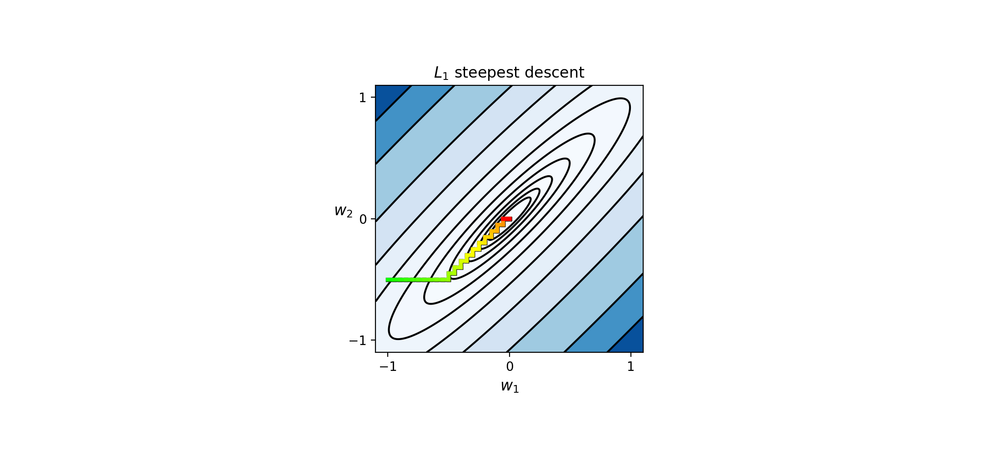

In [5]:
# This code cell will not be shown in the HTML version of this notebook
# the Rastrigin function
g = lambda w: 0.26*(w[0]**2 + w[1]**2) - 0.48*w[0]*w[1]

# run the visualizer for our chosen input function, initial point, and step length alpha
demo = optlib.steepest_descent.visualizer();
w_init = [-1,-0.5]; max_its = 40; steplength = 0.05;

demo.L1(g,w_init,steplength,max_its,num_contours = 30,linewidth = 3,xmin = -1.1, xmax = 1.1, ymin = -1.1, ymax = 1.1)

### A.1  Formal derivation of $\ell_1$ descent direction

In what follows we find a closed form solution to

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{maximize}} & \mathbf{a}^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{1}=1\\
\end{array}
\end{equation}

written entry-wise as

\begin{equation}
\begin{array}{cc}
\underset{d_1,\,d_2,\,\ldots,\, d_n}{\text{maximize}} & a_1d_1+a_2d_2+\cdots+a_nd_n\\
\text{subject to} & \left\vert d_1\right\vert + \left\vert d_2\right\vert + \cdots + \left\vert d_n\right\vert = 1\\
\end{array}
\end{equation}

Firstly notice that if the mathematical sign of $d_i$ differs from that of $a_i$, then replacing $d_i$ with $-d_i$ would increase (or at least not decrease) the objective value without violating the equality constraint. Therefore by writing $d_i$ as

$$d_i=\text{sign}(a_i)\,y_i$$

where $y_i$'s are now all nonnegative, our original problem can be reformulated equivalently as 

\begin{equation}
\begin{array}{cc}
\underset{y_1,\,y_2,\,\ldots,\, y_n}{\text{maximize}} & a_1\,\text{sign}(a_1)\,y_1+a_2\,\text{sign}(a_2)\,y_2+\cdots+a_n\,\text{sign}(a_n)\,y_n\\
\text{subject to} &  \left\vert \text{sign}(a_1)\,y_1\right\vert + \left\vert \text{sign}(a_2)\,y_2\right\vert + \cdots + \left\vert \text{sign}(a_n)\,y_n\right\vert =1\\
& y_1, y_2, \ldots, y_n \geq 0\\
\end{array}
\end{equation}

Noticing that we have $a_i\,\text{sign}(a_i)\,y_i=\left\vert a_i\right\vert \,y_i$ (in the objective), and $\left\vert \text{sign}(a_i)\,y_i\right\vert = \left\vert \text{sign}(a_i)\right\vert \left\vert y_i\right\vert = y_i$, we can rewrite the optimization problem as 

\begin{equation}
\begin{array}{cc}
\underset{y_1,\,y_2,\,\ldots,\, y_n}{\text{maximize}} & \left\vert a_1\right\vert y_1+\left\vert a_2\right\vert y_2+\cdots+\left\vert a_n\right\vert y_n\\
\text{subject to} &  y_1 +  y_2 + \cdots +  y_n =1\\
& y_1, y_2, \ldots, y_n \geq 0\\
\end{array}
\end{equation}

Finally, denoting by $j$ an index of the largest entry in $\mathbf{a}$ (in magnitude)

$$j=\underset{i=1,\,2,\,\ldots,\, n}{\text{argmax}}\left|a_{i}\right|$$

we can find an upperbound to the objective

$$\left|a_{1}\right|y_{1}+\left|a_{2}\right|y_{2}+\ldots+\left|a_{n}\right|y_{n}\leq\left|a_{j}\right|y_{1}+\left|a_{j}\right|y_{2}+\ldots+\left|a_{j}\right|y_{n}=\left|a_{j}\right|$$

Notice that the $j^{th}$ standard basis vector (having $1$ in its $j^{th}$ position and zero elsewhere) gives the same value as this upperbound, and hence $\mathbf{y}=\mathbf{e}_{j}$ is a solution to the reformulated optimization problem.  Moreover if there are several entries of $\mathbf{a}$ that are equally maximal in magnitude the above is true for each of their corresponding indices, the set of which we denote as $\mathcal{S}$.

All together then a solution is given as 

$$
\mathbf{d}^{\star}= \frac{1}{\left| \mathcal{S}\right|}\sum_{j\in \mathcal{S}}\text{sgn}(a_j)\,\mathbf{e}_{j}
$$

where $\left| \mathcal{S}\right|$ denotes the number of elements in $\mathcal{S}$.  

# Momentum exercises

In [1]:
# This code cell will not be shown in the HTML version of this notebook
# import autograd functionality
import autograd.numpy as np
from autograd import grad as compute_grad
from autograd.misc.flatten import flatten_func

# import various other libraries
import copy
import matplotlib.pyplot as plt

# this is needed to compensate for %matplotl+ib notebook's tendancy to blow up images when plotted inline
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

# imports from custom library
import sys
sys.path.append('../../')
from mlrefined_libraries import nonlinear_superlearn_library as nonlib
datapath = '../../mlrefined_datasets/superlearn_datasets/'
%matplotlib notebook
%load_ext autoreload
%autoreload 2

A common problem negatively affecting gradient descent in practice is when it is applied to minimize cost functions whose minima lie in a long narrow valley. We illustrate such a cost function in the right panel of Figure 1: a two-dimensional quadratic with elongated elliptic contours. A regular gradient descent step in this case (shown in solid red) does little to reduce the cost function evaluation because the negative gradient at $\mathbf{w}^{k}$, being perpendicular to the contour line at that point, points far away from the optimal direction (shown in dashed black) connecting $\mathbf{w}^{k}$ to the desired minimum located in the center.

<figure>
<img src= '../../mlrefined_images/tricks/valleys.png' width="100%" height="auto"/>
<figcaption> <strong>Figure 1:</strong> <em> From left to right, as the contours of a two-dimensional quadratic get more elongated, the gradient descent direction (red) diverges from the optimal direction (dashed black) connecting $\mathbf{w}^{k}$ to the desired minimum located in the center. </em>
</figcaption>
</figure>

The progress of gradient descent is significantly slowed down due to the geometry of narrow valleys which causes gradient descent steps to zig-zag towards a solution. This problem motivates the concept of an old and simple heuristic known as the momentum term, added to the standard gradient descent. 
The momentum term is a simple weighted difference of the subsequent $k^{th}$ and $(k−1)^{th}$ gradient steps, i.e., $\beta \left(\mathbf{w}^k - \mathbf{w}^{k-1}\right)$ for some $\beta >0$. As illustrated in Figure 2, the momentum term is designed to even out the zig-zagging effect of regular gradient descent by tilting back the gradient steps (that move perpendicular to the contours of the cost function) towards the center where the minimum lies. The $k^{th}$ gradient descent step as well as the $k^{th}$ gradient descent step with momentum are shown in Figure 2, colored red and blue respectively.

<figure>
<img src= '../../mlrefined_images/nonlinear_superlearn_images/momentum_fig.png' width="80%" height="auto"/>
<figcaption> <strong>Figure 2:</strong> <em> A figurative illustration of a gradient descent (red) and a momentum-adjusted gradient descent (blue) step toward the minimum of a function located at the center of a long narrow valley. The addition of the momentum term (dashed black arrow) pushes the negative gradient toward the function's minimum, thus ameliorating the zig-zagging inherent in standard gradient descent. </em>
</figcaption>
</figure>

To derive the momentum-adjusted gradient step update we add the momentum term $\beta \left(\mathbf{w}^k - \mathbf{w}^{k-1}\right)$ to the standard gradient descent update at $\mathbf{w}^k$, giving  

\begin{equation}
\mathbf{w}^{k+1} = \mathbf{w}^k - \alpha \nabla g\left(\mathbf{w}^k\right) + \beta \left(\mathbf{w}^{k} - \mathbf{w}^{k-1}\right)
\end{equation}

where the parameter $0< \beta < 1$ trades off the direction from the negative gradient and momentum term. If desired, $\beta$ can be adjusted as well at each iteration. When tuned properly the adjusted gradient descent step with momentum is known empirically to significantly improve the convergence of gradient descent (see e.g., [[1]](#bib_cell)).

The momentum update in equation (1) is often written in an equivalent manner by subtracting $\mathbf{w}_k$ from both sides of equation (1), and dividing both sides by $-\alpha$ to get

\begin{equation}
\frac{1}{-\alpha}\left(\mathbf{w}^{k+1}-\mathbf{w}^k\right) =  \nabla g\left(\mathbf{w}^k\right) - \frac{\beta}{\alpha} \left(\mathbf{w}^{k} - \mathbf{w}^{k-1}\right)
\end{equation}

Denoting the left hand side of (2) by a new variable $\mathbf{z}^{k+1} = \frac{1}{-\alpha}\left(\mathbf{w}^{k+1}-\mathbf{w}^k\right)
$, we can rewrite it as 

\begin{equation}
\mathbf{z}^{k+1} =  \nabla g\left(\mathbf{w}^k\right) +\beta\, \mathbf{z}^{k}
\end{equation}

Equation (3) together with a simple rearrangement of $\mathbf{z}^{k+1} = \frac{1}{-\alpha}\left(\mathbf{w}^{k+1}-\mathbf{w}^k\right)$ give the following momentum update, done in two de-coupled steps  

\begin{equation}
\begin{array}
\
\mathbf{z}^{k+1} = \beta\,\mathbf{z}^{k} + \nabla g\left(\mathbf{w}^k\right) \\
\mathbf{w}^{k+1} = \mathbf{w}^{k} - \alpha \, \mathbf{z}^{k+1}
\end{array}
\end{equation}

which is equivalent to the original derivation in equation (1).

In the Python cell below we modify our gradient descent code by adding <code>beta</code> as an input parameter, and adjusting the gradient descent step as derived in equation (4).     

In [4]:
def gradient_descent(g,w,alpha,max_its,beta,version):    
    # flatten the input function, create gradient based on flat function
    g_flat, unflatten, w = flatten_func(g, w)
    grad = compute_grad(g_flat)

    # record history
    w_hist = []
    w_hist.append(unflatten(w))

    # start gradient descent loop
    z = np.zeros((np.shape(w)))      # momentum term
    
    # over the line
    for k in range(max_its):   
        # plug in value into func and derivative
        grad_eval = grad(w)
        grad_eval.shape = np.shape(w)

        ### normalized or unnormalized descent step? ###
        if version == 'normalized':
            grad_norm = np.linalg.norm(grad_eval)
            if grad_norm == 0:
                grad_norm += 10**-6*np.sign(2*np.random.rand(1) - 1)
            grad_eval /= grad_norm
            
        # take descent step with momentum
        z = beta*z + (1 - beta)*grad_eval
        w = w - alpha*z

        # record weight update
        w_hist.append(unflatten(w))

    return w_hist

#### <span style="color:#a50e3e;">Example 1. </span>  Using momentum to speed up the minimization of simple quadratic functions

A simple quadratic cost function in 2-d takes the form

\begin{equation}
g(\mathbf{w}) = a + \mathbf{b}^T\mathbf{w} + \mathbf{w}^T\mathbf{C}\mathbf{w}
\end{equation}

where $a$ is a scalar, $\mathbf{b}$ a $2\times1$ vector, and $\mathbf{C}$ a $2\times2$ matrix.

Setting $a = 0$, $\mathbf{b} = \begin{bmatrix} 0 \\ 0 \end{bmatrix}$, and $\mathbf{C} = \begin{bmatrix} 1\,\,0 \\ 0 \,\, 12\end{bmatrix}$ in the Python cell below we run gradient descent with ($\beta = 0.3$) and without ($\beta = 0$) momentum for a maximum of $10$ iterations with the steplength parameter set to $\alpha = 0.08$ in both cases.   

<IPython.core.display.Javascript object>


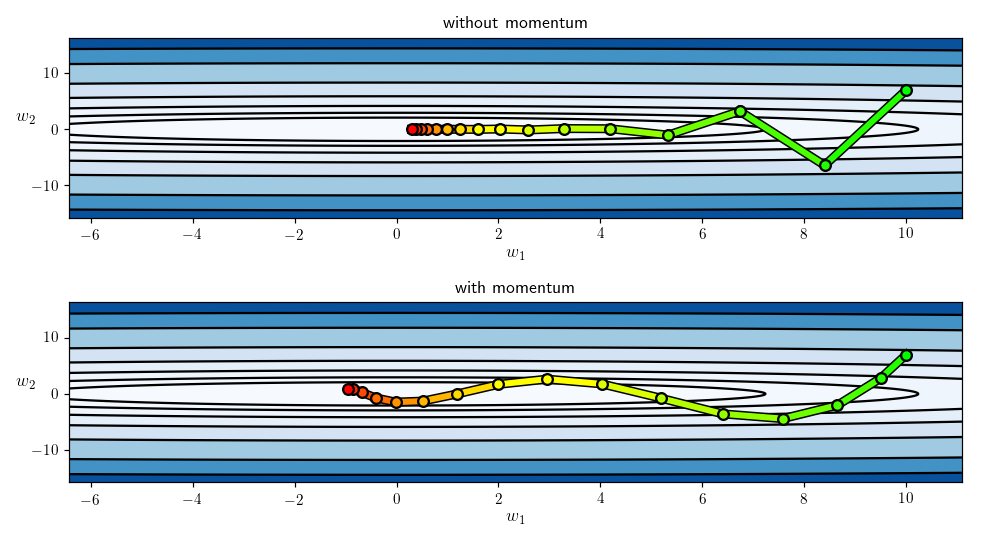

In [20]:
# This code cell will not be shown in the HTML version of this notebook
# define constants for a N=2 input quadratic
a = 0
b = np.zeros((2,1))
C = np.array([[1,0],[0,12]])

# a quadratic function defined using the constants above
g = lambda w: (a + np.dot(b.T,w) + np.dot(np.dot(w.T,C),w))[0]

# setup initialization
w_init = np.ones((2,1))
w_init[1] = 7
w_init[0] = 10

# w_init = np.random.randn(2,1)
alpha = 10**(-1)
max_its = 15
version = 'unnormalized'

# use momentum with beta = 0
beta = 0.2
weight_history_1 = gradient_descent(g,w_init,alpha,max_its,beta,version)

# use momentum with beta = 0.3
beta = 0.75
weight_history_4 = gradient_descent(g,w_init,alpha,max_its,beta,version)

# visualize
demo = nonlib.contour_run_comparison.Visualizer()
demo.show_paths(g, weight_history_1,weight_history_4,num_contours = 20)

As can be seen the addition of the momentum term (bottom panel) corrects the zig-zagging effect of standard gradient, achieving a lower solution with the same number of iterations.     

As illustrated in Figure 1, the longer and narrower the valley where the minimum lies in, the more severe the zig-zagging effect becomes, and the larger we should set $\beta$ as a result.

We repeat the previous experiment this time using another quadratic function with $a = 0$, $\mathbf{b} = \begin{bmatrix} 2 \\ 0 \end{bmatrix}$, and $\mathbf{C} = \begin{bmatrix} 0\,\,0 \\ 0 \,\, 12\end{bmatrix}$. We run gradient descent with ($\beta = 0.7$) and without ($\beta = 0$) momentum for a maximum of $20$ iterations with the steplength parameter set to $\alpha = 0.08$ in both cases. 

<IPython.core.display.Javascript object>


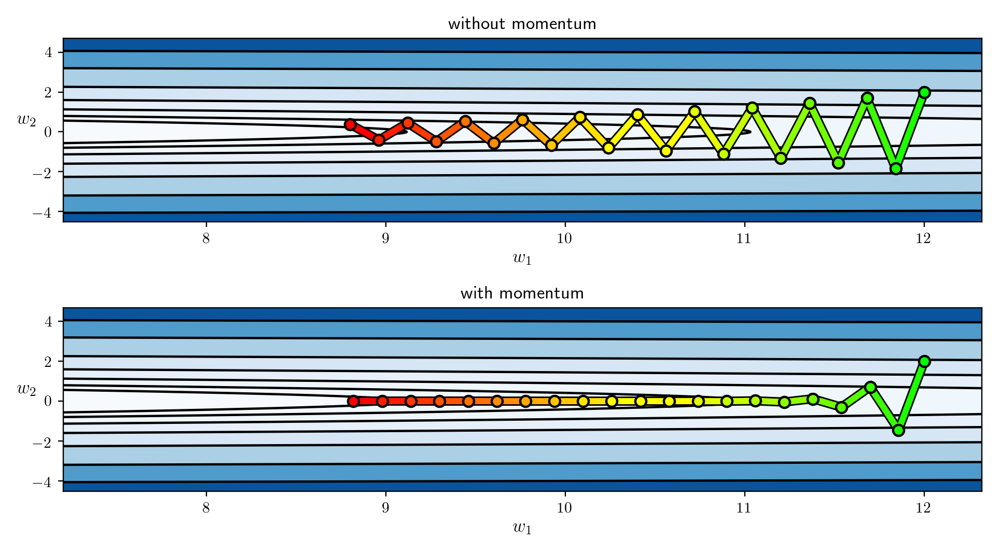

In [23]:
# This code cell will not be shown in the HTML version of this notebook
# define constants for a N=2 input quadratic
a = 0
b = 2*np.ones((2,1))
b[1] = 0
C = np.array([[0,0],[0,12]])

# a quadratic function defined using the constants above
g = lambda w: (a + np.dot(b.T,w) + np.dot(np.dot(w.T,C),w))[0]

# setup initialization
w_init = np.ones((2,1))
w_init[1] = 2
w_init[0] = 12

# w_init = np.random.randn(2,1)
alpha = 8*10**(-2)
max_its = 20
version = 'unnormalized'

# use momentum with beta = 0
beta = 0
weight_history_1 = gradient_descent(g,w_init,alpha,max_its,beta,version)

# use momentum with beta = 0.7
beta = 0.1
weight_history_2 = gradient_descent(g,w_init,alpha,max_its,beta,version)

# visualize
demo = nonlib.contour_run_comparison.Visualizer()
demo.show_paths(g, weight_history_1,weight_history_2,num_contours = 20)

#### <span style="color:#a50e3e;">Example 2. </span>  Using momentum to speed up the minimization of linear two-class classification

The use of momentum is not limited to convex costs as non-convex functions can too have problematic long narrow valleys. In this example we compare the quality of solutions achieved by standard gradient descent and its momentum-adjusted version using the (non-convex) logistic Least Squares cost function on a simulated 1-d classification dataset. 
Both algorithms are initialized at the same point, and run for $25$ iterations with $\alpha = 1$. 

Moving the slider widget from left to right animates the optimization path taken by each algorithm as well as the corresponding fit to the data with (blue) and without (magenta) momentum. 


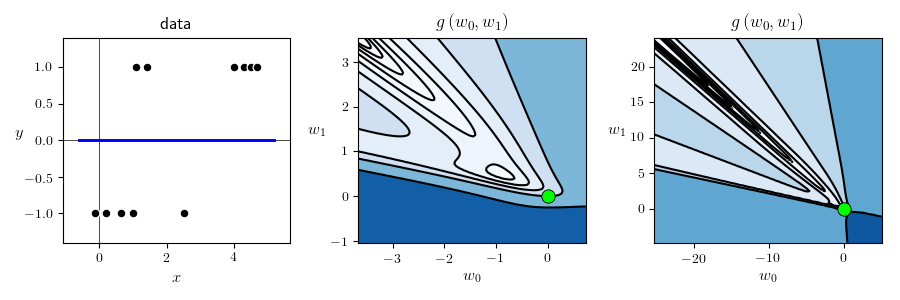
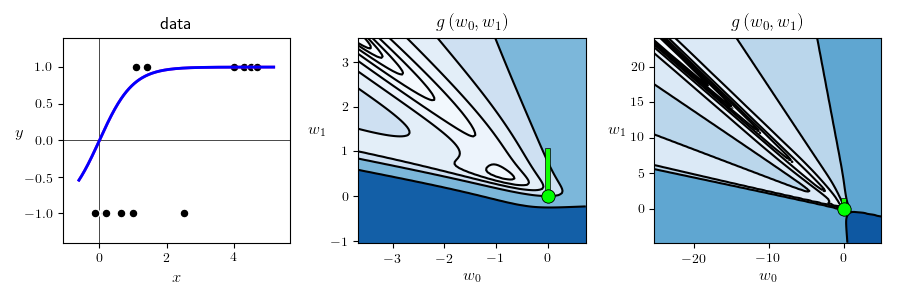
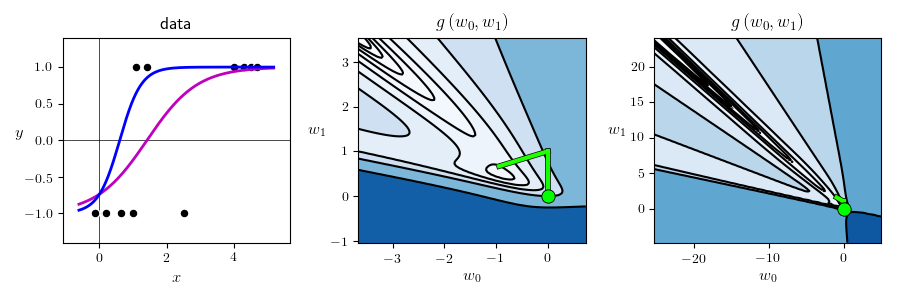
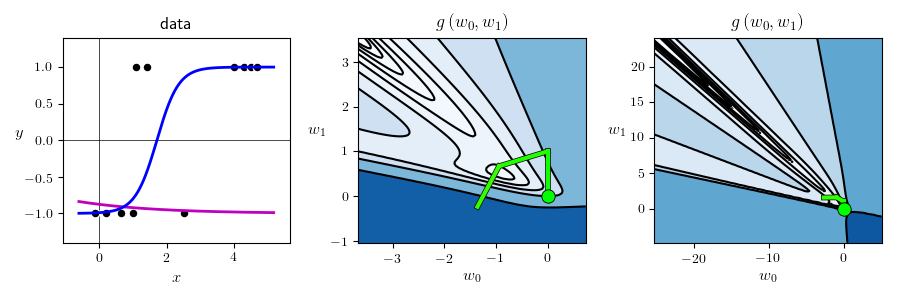
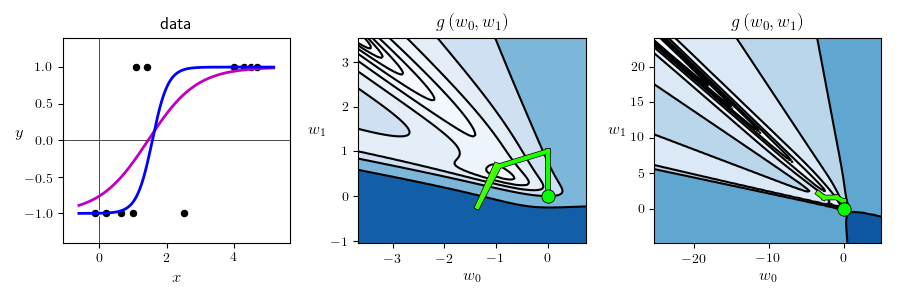
...
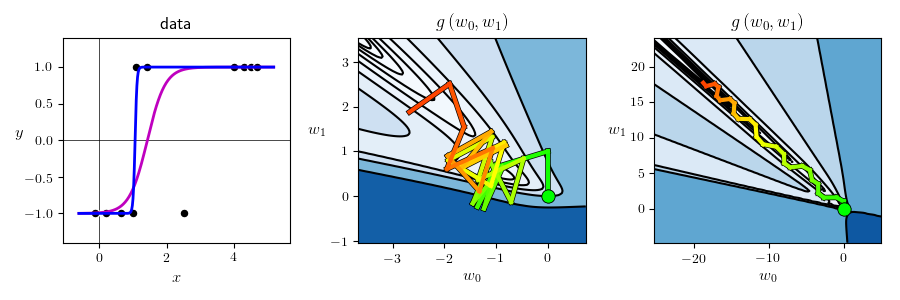
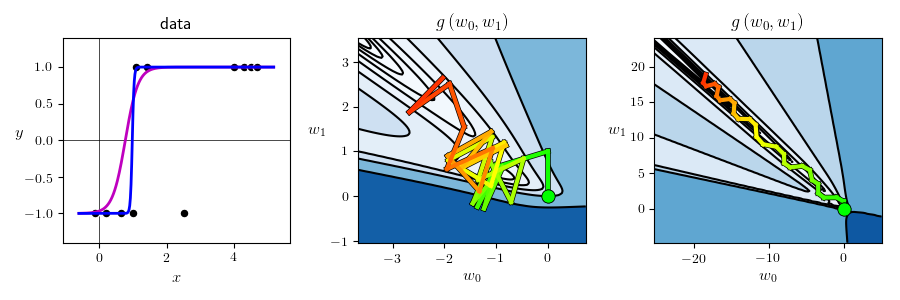
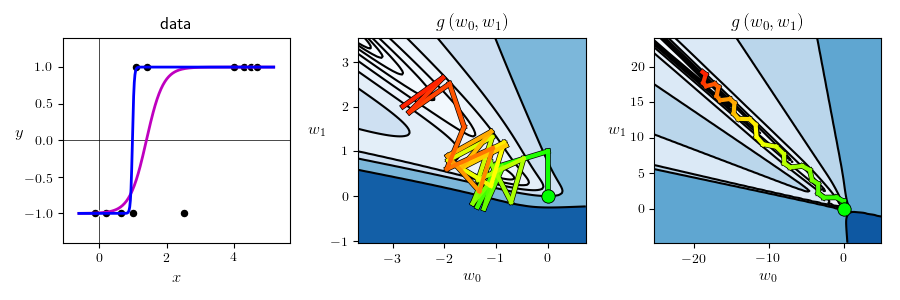
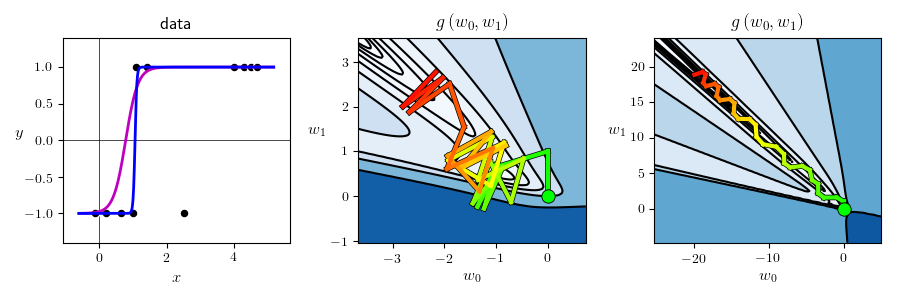
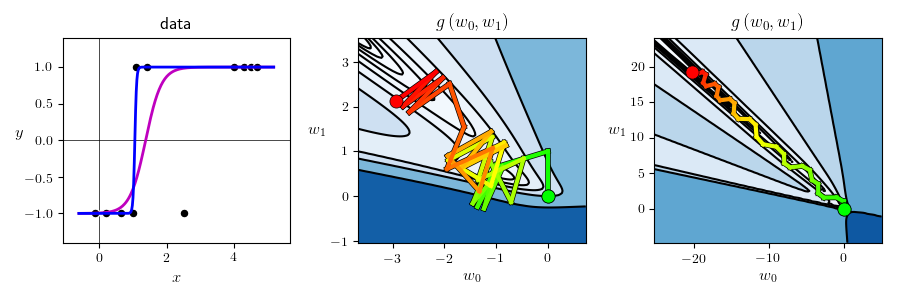

In [56]:
# This code cell will not be shown in the HTML version of this notebook
# tanh non-convex logistic least squares cost function
def tanh_least_squares(w):
    cost = 0
    for p in range(0,len(y)):
        x_p = x[p,:]
        y_p = y[p]
        cost +=(np.tanh(w[0] + w[1]*x_p) - y_p)**2
    return cost

# load in dataset
csvname = datapath + '2d_classification_data_v2.csv'
data = np.loadtxt(csvname, delimiter = ' ')

# define the input and output of our dataset
x = data[:,0]
x.shape = (len(x),1)
y = data[:,1]
y.shape = (len(y),1)

w_init[0] = 0
w_init[1] = 0
alpha = 1
max_its = 30
version = 'normalized'

# use momentum with beta = 0
beta = 0
weight_history_1 = gradient_descent(tanh_least_squares,w_init,alpha,max_its,beta,version)

# use momentum with beta = 0.9
beta = 0.9
weight_history_4 = gradient_descent(tanh_least_squares,w_init,alpha,max_its,beta,version)

# create instance of logisic regression demo and load in data, cost function, and descent history
demo3 = nonlib.classification_2d_demos_v2.Visualizer(data,tanh_least_squares)

# animate descent process
demo3.animate_runs(weight_history_1,weight_history_4,num_contours = 25)

Another popular variant of the momentum method is derived when a momentum term, i.e., $\beta\left(\mathbf{w}^k-\mathbf{w}^{k-1}\right)$, is added not only to the gradient descent update as in Equation (1) but also to the inside of the gradient term itself, giving

\begin{equation}
\mathbf{w}^{k+1} = \mathbf{w}^k - \alpha \nabla g\left(\mathbf{w}^k+\beta\left(\mathbf{w}^k-\mathbf{w}^{k-1}\right)\right) + \beta \left(\mathbf{w}^{k} - \mathbf{w}^{k-1}\right)
\end{equation}

Denoting $\mathbf{w}^k+\beta\left(\mathbf{w}^k-\mathbf{w}^{k-1}\right)$ as $\mathbf{\tilde w}^k$, the momentum step in (6), typically referred to as the Nesterov momentum, can be thought of and written as a regular gradient descent step at $\mathbf{\tilde w}^k$

\begin{equation}
\mathbf{w}^{k+1} = \mathbf{\tilde w}^k - \alpha \nabla g\left(\mathbf{\tilde w}^k\right)
\end{equation}

In Figure 3, through a figurative illustration, we show how taking a gradient step at $\mathbf{\tilde w}^k$ (instead of $\mathbf{w}^k$) helps ameliorate the zig-zagging phenomenon associated with long, narrow valleys.   

<figure>
<img src= '../../mlrefined_images/nonlinear_superlearn_images/Nesterov_momentum.png' width="100%" height="auto"/>
<figcaption> <strong>Figure 3:</strong> <em> A figurative illustration of a gradient descent (red) and a Nesterov momentum-adjusted gradient descent (blue) step toward the minimum of a function located at the center of a long narrow valley.  </em>
</figcaption>
</figure>

The Nesterov momentum update in (6) is sometimes written in two steps, equivalently as


\begin{equation}
\begin{array}
\
\mathbf{z}^{k+1} = \beta\,\mathbf{z}^{k} + \nabla g\left(\mathbf{w}^k-\alpha\beta\,\mathbf{z}^{k}\right) \\
\mathbf{w}^{k+1} = \mathbf{w}^{k} - \alpha \, \mathbf{z}^{k+1}
\end{array}
\end{equation}

Practically speaking both momentum updates in (1) and (6) are similarly effective.

#### <span style="color:#a50e3e;">Example 3. </span>  Using momentum for optimizing a multi-layer perceptron

In this Example we use gradient descent with and without momentum on a two-class classification dataset collected for the task of face detection, consisting of $P=10,000$ face and non-face images.

Once the data is loaded, we move on to initiate a supervised learning instance using our deep learning library, create a four-layer neural network basis consisting of $10$ units in each layer, and choose an activation function (here, ReLU), data normalization scheme (here, standard normalization) as well as the cost function (here, softmax).  

We now run gradient descent twice for $200$ iterations using the same initialization and steplength parameter, once without momentum ($\beta=0$) and once with momentum parameter set to $\beta=0.9$.   

<IPython.core.display.Javascript object>


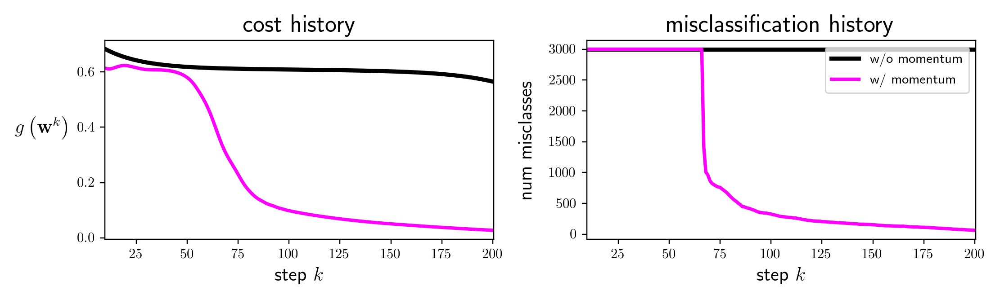

In [10]:
# This code cell will not be shown in the HTML version of this notebook
# import custom library
from mlrefined_libraries.deeplearning_library_v1 import superlearn_setup

# define path to datasets
datapath = '../../mlrefined_datasets/'

csvname = datapath + 'convnet_datasets/feat_face_data.csv'
data = np.loadtxt(csvname, delimiter = ',')
x = data[:,:-1].T
y = data[:,-1:].T

# initiate an instance
demo = superlearn_setup.Setup(x,y)

# choose a neural network architecture
demo.choose_features(name='multilayer_perceptron', layer_sizes=[784,10,10,10,10,1], activation='relu')

# choose a data normalization scheme
demo.choose_normalizer(name = 'standard')

# choose a cost function
demo.choose_cost(name = 'softmax')

# run gradient descent without momentum
demo.fit(max_its = 200, alpha_choice = 10**(-1), beta=0)

# run gradient descent with momentum
demo.fit(max_its = 200, alpha_choice = 10**(-1), beta=0.9)

# plot the results
demo.show_histories(start = 10, labels=['w/o momentum','w/ momentum'])

<a id='bib_cell'></a>

## References

[1] Ning Qian. On the momentum term in gradient descent learning algorithms. Neural Networks, 12(1) 145–151, 1999.

&copy; This material is not to be distributed, copied, or reused without written permission from the authors.